In [1]:
# Imports
%load_ext nb_black
from os import makedirs
from os.path import join
import joblib
import numpy as np

rng_seed = 399
np.random.seed(rng_seed)
from scipy.stats import pearsonr
from matplotlib import pyplot as plt
import seaborn as sns

sns.set_theme()
from tqdm.auto import tqdm
import pandas as pd
import gudhi as gd
from gudhi.wasserstein import wasserstein_distance

from nltk.corpus import wordnet as wn
import annoy
from umap import UMAP
from sklearn.decomposition import PCA

import plotly.offline as pyo

pyo.init_notebook_mode()
import plotly.express as px
import plotly.graph_objects as go

# Directory constants
topological_data_analysis_data_dir = "data"
root_code_dir = ".."
output_dir = join(root_code_dir, "output")
word2vec_training_dir = join(output_dir, "word2vec_training")
word2vec_ann_indices_dir = join(output_dir, "word2vec_ann_indices")
word2vec_cluster_analysis_dir = join(output_dir, "word2vec_cluster_analysis")

# Extend sys path for importing custom Python files
import sys

sys.path.append(root_code_dir)

from utils import (
    get_model_checkpoint_filepaths,
    pairwise_cosine_distances,
    words_to_vectors,
    normalize_array,
)
from word_embeddings.word2vec import load_model_training_output
from vis_utils import plot_word_vectors
from topological_data_analysis.tda_utils import (
    plot_persistence_diagram,
    generate_points_in_spheres,
)
from topological_data_analysis.topological_polysemy import tps, tps_point_cloud

<IPython.core.display.Javascript object>

# Prepare data

In [2]:
# Constants
tps_neighbourhood_size = 50

<IPython.core.display.Javascript object>

In [3]:
# Load output from training word2vec
w2v_training_output = load_model_training_output(
    model_training_output_dir=join(
        word2vec_training_dir, "word2vec_enwiki_jan_2021_word2phrase"
    ),
    model_name="word2vec",
    dataset_name="enwiki",
    return_normalized_embeddings=True,
    return_annoy_index=True,
    annoy_index_prefault=True,
)
last_embedding_weights = w2v_training_output["last_embedding_weights"]
last_embedding_weights_normalized = w2v_training_output[
    "last_embedding_weights_normalized"
]
last_embedding_weights_annoy_index = w2v_training_output[
    "last_embedding_weights_annoy_index"
]
words = w2v_training_output["words"]
word_to_int = w2v_training_output["word_to_int"]
word_counts = w2v_training_output["word_counts"]

<IPython.core.display.Javascript object>

In [4]:
# Load SemEval data
semeval_2010_14_word_senses = joblib.load(
    join(topological_data_analysis_data_dir, "semeval_2010_14_word_senses.joblib")
)

<IPython.core.display.Javascript object>

# Topolocial polysemy

## TPS for 100 SemEval target words

In [5]:
# Prepare data
semeval_target_word_tps_scores = {}

semeval_target_words = np.array(list(semeval_2010_14_word_senses["all"].keys()))
semeval_target_words_in_vocab_filter = [
    i for i, word in enumerate(semeval_target_words) if word in word_to_int
]
semeval_target_words_in_vocab = semeval_target_words[
    semeval_target_words_in_vocab_filter
]
semeval_gs_clusters = np.array(list(semeval_2010_14_word_senses["all"].values()))
semeval_gs_clusters_in_vocab = semeval_gs_clusters[semeval_target_words_in_vocab_filter]

num_semeval_words = len(semeval_gs_clusters_in_vocab)

<IPython.core.display.Javascript object>

Neighbourhood size: 50


  0%|          | 0/98 [00:00<?, ?it/s]

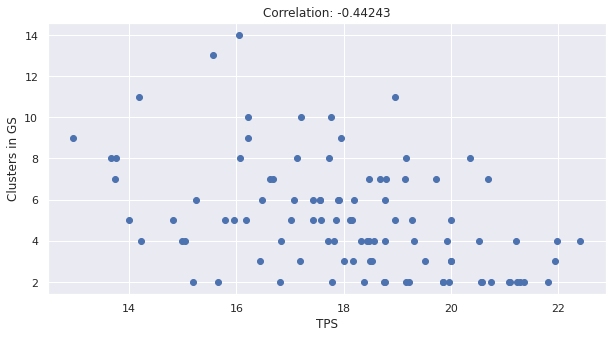

<IPython.core.display.Javascript object>

In [6]:
print(f"Neighbourhood size: {tps_neighbourhood_size}")

# Compute TPS scores
semeval_tps_scores = []
semeval_tps_persistence_diagrams = []
for i, (semeval_target_word, semeval_target_word_clusters) in enumerate(
    tqdm(
        zip(semeval_target_words_in_vocab, semeval_gs_clusters_in_vocab),
        total=num_semeval_words,
    )
):
    tps_score, tps_persistence_diagram = tps(
        target_word=semeval_target_word,
        word_embeddings=last_embedding_weights,
        words_vocabulary=None,
        word_to_int=word_to_int,
        neighbourhood_size=tps_neighbourhood_size,
        word_embeddings_normalized=last_embedding_weights_normalized,
        word_embeddings_pairwise_dists=None,
        annoy_index=last_embedding_weights_annoy_index,
        return_persistence_diagram=True,
    )
    semeval_tps_scores.append(tps_score)
    semeval_tps_persistence_diagrams.append(tps_persistence_diagram)
semeval_tps_scores = np.array(semeval_tps_scores)

# Compute correlation
semeval_tps_score_gs_correlation, _ = pearsonr(
    x=semeval_tps_scores, y=semeval_gs_clusters_in_vocab
)

# Plot TPS scores to GS
plt.figure(figsize=(10, 5))
plt.scatter(x=semeval_tps_scores, y=semeval_gs_clusters_in_vocab)
plt.xlabel("TPS")
plt.ylabel("Clusters in GS")
plt.title(f"Correlation: {semeval_tps_score_gs_correlation:.5f}")
plt.show()

## Persistence diagrams of high/low TPS words

In [7]:
# Sort words by TPS score
semeval_tps_scores_sorted_indices = np.argsort(semeval_tps_scores)[::-1]
semeval_tps_scores_sorted = semeval_tps_scores[semeval_tps_scores_sorted_indices]
semeval_target_words_sorted = np.array(list(semeval_2010_14_word_senses["all"].keys()))[
    semeval_tps_scores_sorted_indices
]
semeval_tps_persistence_diagrams_sorted = np.array(
    semeval_tps_persistence_diagrams, dtype="object"
)[semeval_tps_scores_sorted_indices]

top_k_words = 3
top_k_semeval_tps_words = [
    (
        i,
        semeval_target_words_sorted[i],
        semeval_tps_scores_sorted[i],
        semeval_gs_clusters[i],
    )
    for i in range(top_k_words)
]
bottom_k_semeval_tps_words = [
    (
        i,
        semeval_target_words_sorted[i],
        semeval_tps_scores_sorted[i],
        semeval_gs_clusters[i],
    )
    for i in range(num_semeval_words - top_k_words, num_semeval_words)
]
top_bottom_k_semeval_tps_words = [*top_k_semeval_tps_words, *bottom_k_semeval_tps_words]
top_bottom_k_semeval_tps_word_ints = [
    word_to_int[word] for _, word, _, _ in top_bottom_k_semeval_tps_words
]
print(f"Top {top_k_words} SemEval TPS words\n", top_k_semeval_tps_words)
print()
print(f"Bottom {top_k_words} SemEval TPS words\n", bottom_k_semeval_tps_words)

Top 3 SemEval TPS words
 [(0, 'speed', 22.40785102517469, 3), (1, 'innovation', 21.966447187506713, 3), (2, 'deny', 21.937682803654457, 2)]

Bottom 3 SemEval TPS words
 [(95, 'foundation', 13.742923227395398, 6), (96, 'moment', 13.672220869137504, 9), (97, 'chip', 12.957880794790075, 4)]


<IPython.core.display.Javascript object>

usetex mode requires dvipng.


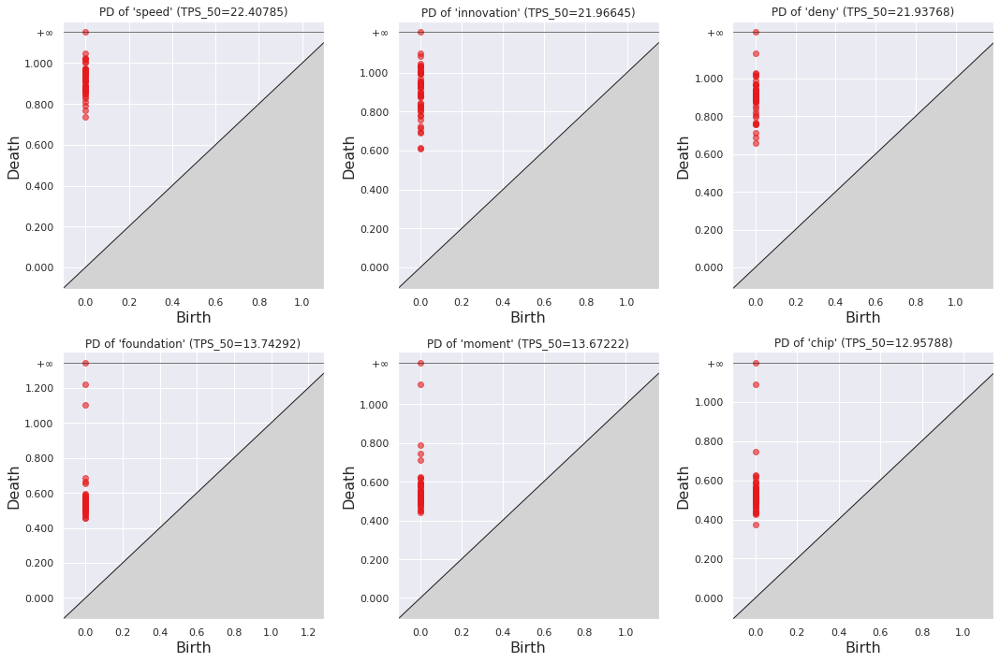

<IPython.core.display.Javascript object>

In [8]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(5 * 3, 5 * 2))
for (i, word, word_tps, _), ax in zip(top_bottom_k_semeval_tps_words, axes.ravel()):
    gd.plot_persistence_diagram(semeval_tps_persistence_diagrams_sorted[i], axes=ax)
    ax.set_title(f"PD of '{word}' (TPS_{tps_neighbourhood_size}={word_tps:.5f})")
plt.tight_layout()
plt.show()

## Neighbouring words of high/low TPS words

In [9]:
top_bottom_k_semeval_tps_vocab_word_ints = []
top_bottom_k_semeval_tps_word_neighbourhood = {}
for _, word, _, _ in top_bottom_k_semeval_tps_words:
    word_int = word_to_int[word]
    neighbouring_word_ints = last_embedding_weights_annoy_index.get_nns_by_item(
        i=word_int, n=tps_neighbourhood_size + 1
    )[1:]
    top_bottom_k_semeval_tps_word_neighbourhood[word_int] = neighbouring_word_ints
    top_bottom_k_semeval_tps_vocab_word_ints.extend([word_int, *neighbouring_word_ints])

<IPython.core.display.Javascript object>

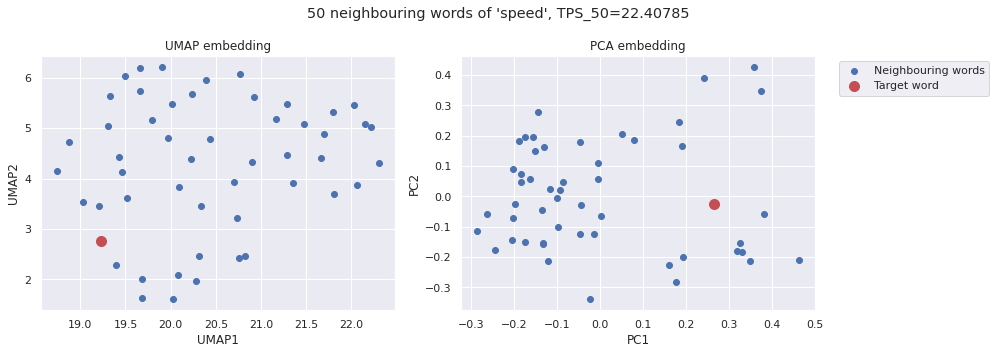

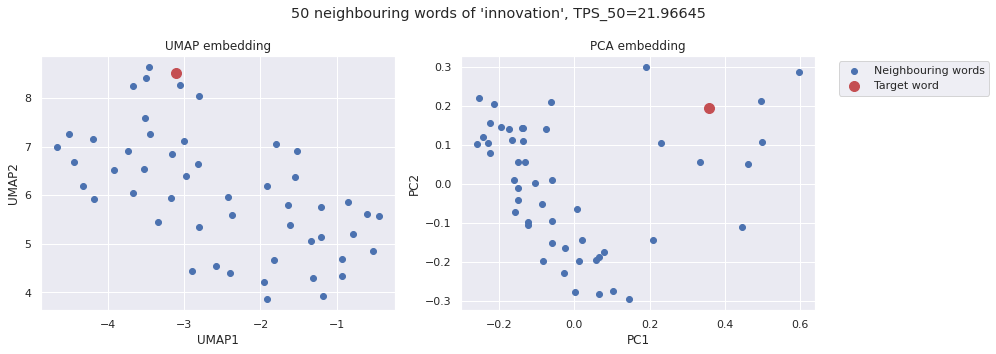

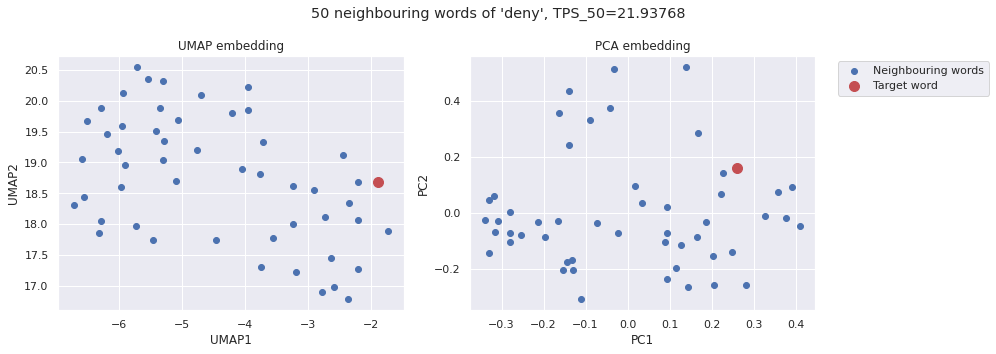

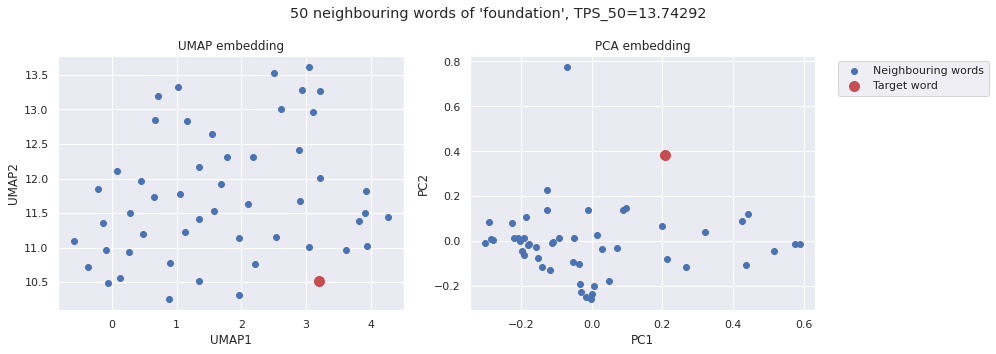

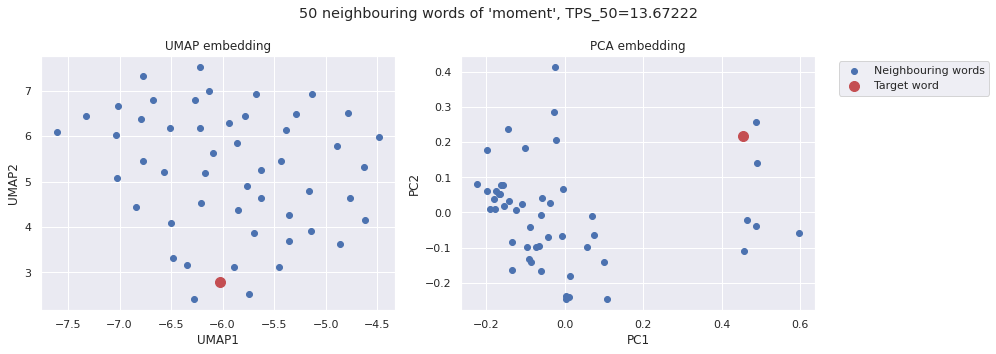

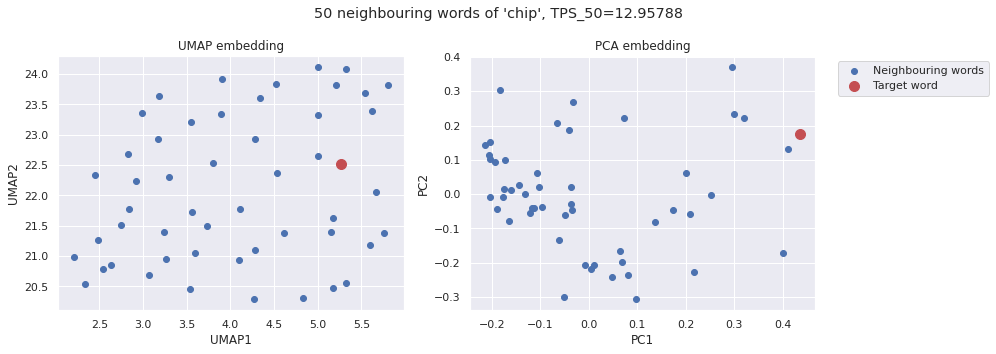

<IPython.core.display.Javascript object>

In [10]:
for _, word, word_tps, _ in top_bottom_k_semeval_tps_words:

    # Find neighbouring word ints
    word_int = word_to_int[word]
    neighbouring_word_ints = last_embedding_weights_annoy_index.get_nns_by_item(
        i=word_int, n=tps_neighbourhood_size + 1
    )[1:]

    # Compute UMAP and PCA embedding of neighbouring words
    embedders = [(UMAP, "UMAP1", "UMAP2"), (PCA, "PC1", "PC2")]
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(7 * 2, 5))
    for (embedder, x_label, y_label), ax in zip(embedders, axes.ravel()):
        tps_word_embeddings_transformed = embedder(
            n_components=2,
            random_state=rng_seed,
        ).fit_transform(
            last_embedding_weights_normalized[[word_int, *neighbouring_word_ints]]
        )

        ax.scatter(
            tps_word_embeddings_transformed[1:, 0],
            tps_word_embeddings_transformed[1:, 1],
            c="b",
            label="Neighbouring words",
        )
        ax.scatter(
            tps_word_embeddings_transformed[0, 0],
            tps_word_embeddings_transformed[0, 1],
            c="r",
            s=100,
            label="Target word",
        )
        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.set_title(f"{embedder.__name__} embedding")
    plt.suptitle(
        f"{tps_neighbourhood_size} neighbouring words of '{word}', TPS_{tps_neighbourhood_size}={word_tps:.5f}"
    )
    plt.legend(bbox_to_anchor=(1.05, 1.0), loc="upper left")
    plt.tight_layout()
    plt.show()

## TPS of points in n-dimensional spheres

-- Sphere dimensionality: 2 --


  0%|          | 0/20001 [00:00<?, ?it/s]

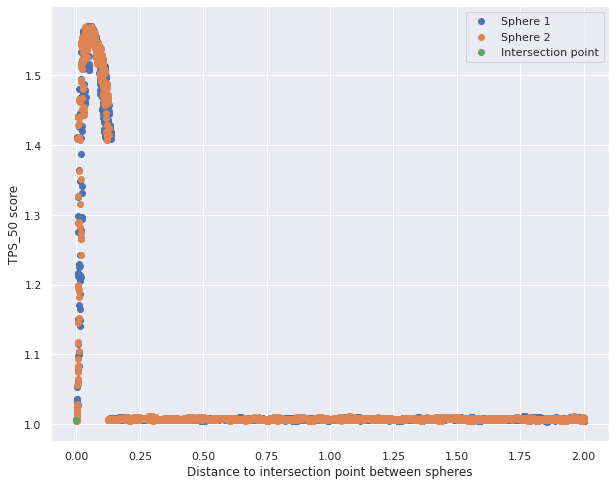

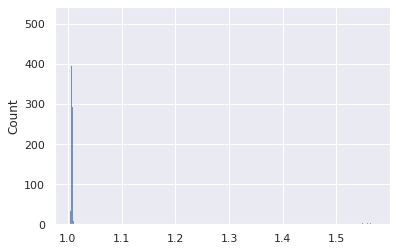

Sphere 1 mean: 1.02686352213429


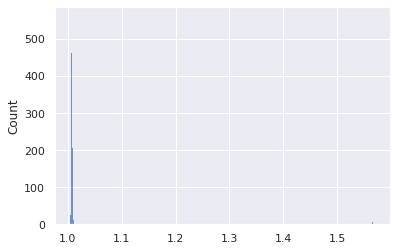

Sphere 2 mean: 1.025483054089568
Intersection TPS: 1.0052607618108043
-- Sphere dimensionality: 3 --


  0%|          | 0/20001 [00:00<?, ?it/s]

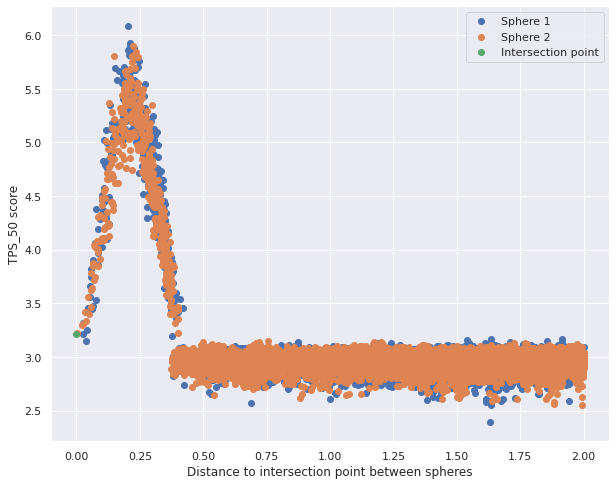

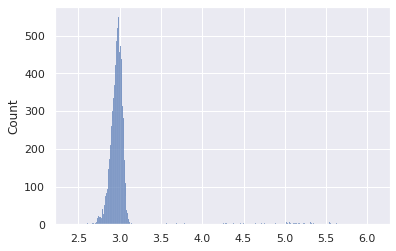

Sphere 1 mean: 3.021721200919866


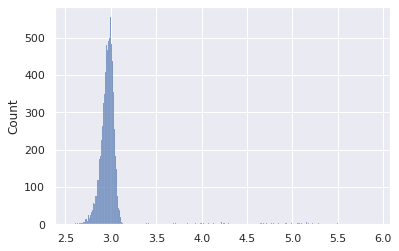

Sphere 2 mean: 3.023083728238146
Intersection TPS: 3.217450656785775
-- Sphere dimensionality: 4 --


  0%|          | 0/20001 [00:00<?, ?it/s]

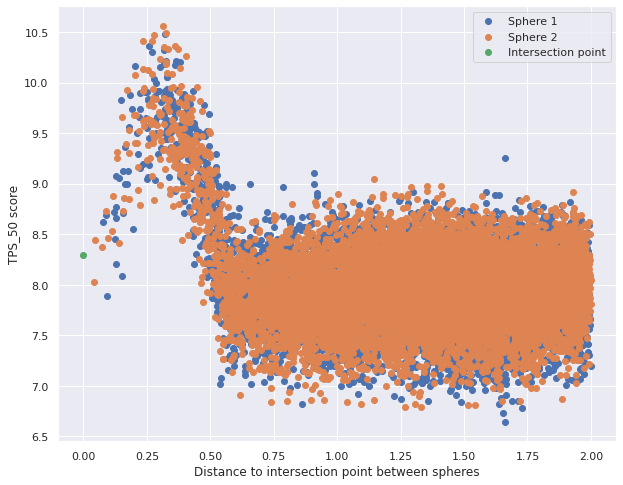

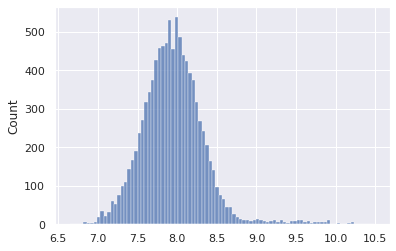

Sphere 1 mean: 7.951841406004363


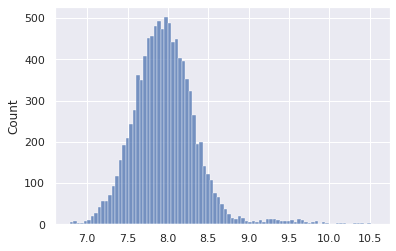

Sphere 2 mean: 7.9708489797453135
Intersection TPS: 8.295714766521714
-- Sphere dimensionality: 5 --


  0%|          | 0/20001 [00:00<?, ?it/s]

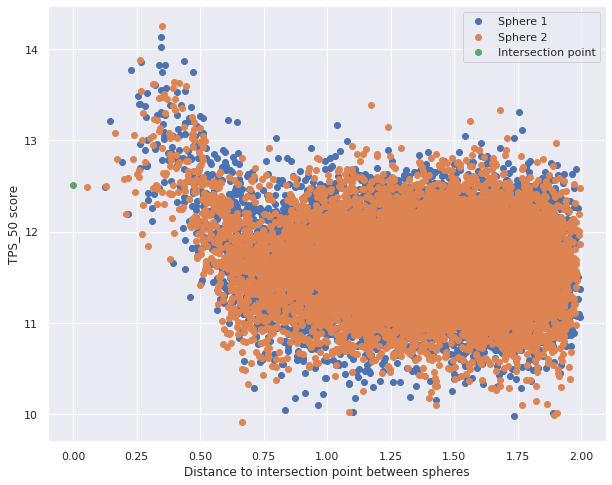

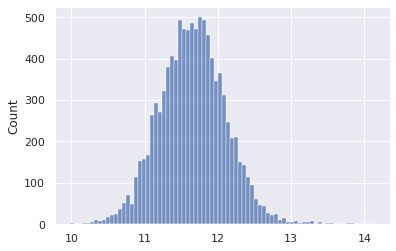

Sphere 1 mean: 11.658436398682367


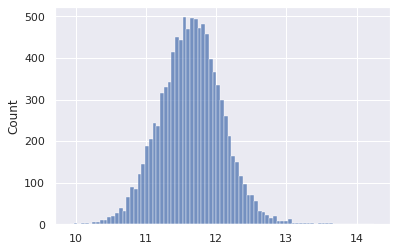

Sphere 2 mean: 11.648428499604481
Intersection TPS: 12.510575732184648
-- Sphere dimensionality: 10 --


  0%|          | 0/20001 [00:00<?, ?it/s]

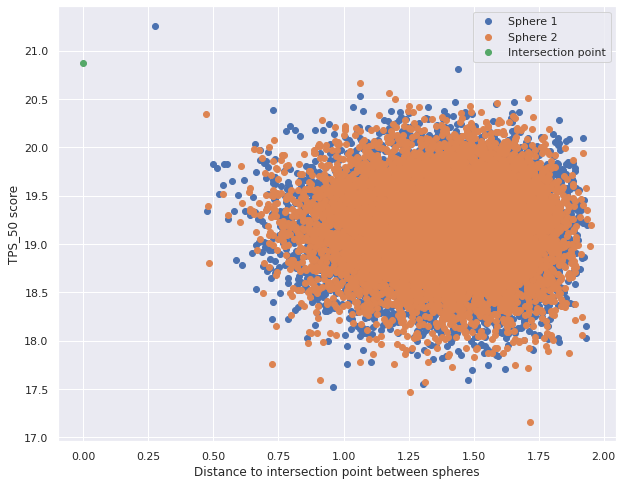

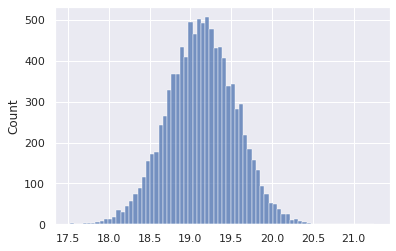

Sphere 1 mean: 19.138436999690374


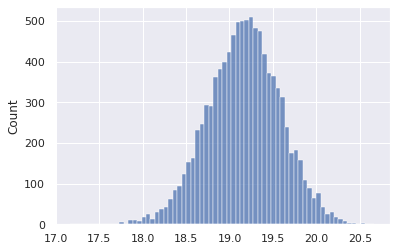

Sphere 2 mean: 19.165504145157527
Intersection TPS: 20.87193075544733
-- Sphere dimensionality: 20 --


  0%|          | 0/20001 [00:00<?, ?it/s]

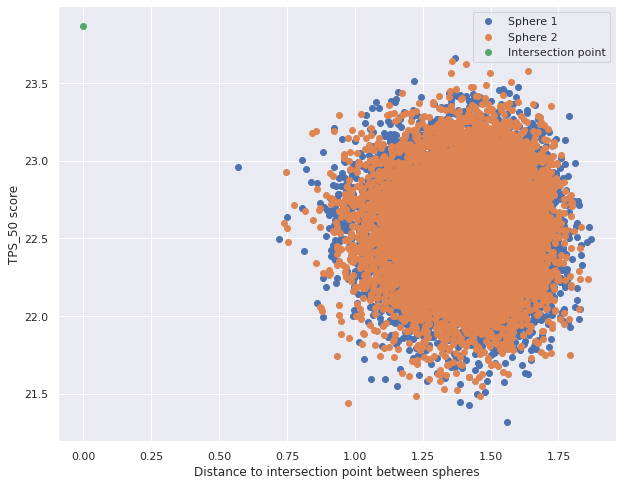

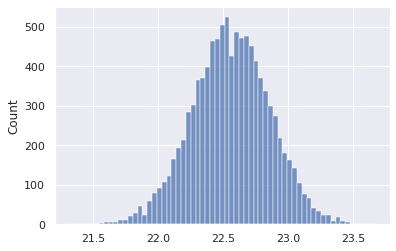

Sphere 1 mean: 22.55827771641753


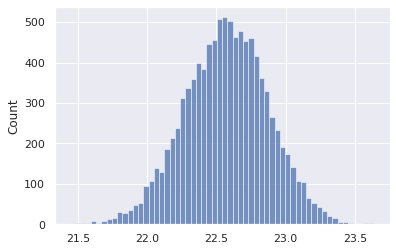

Sphere 2 mean: 22.568588968821132
Intersection TPS: 23.865059398942744
-- Sphere dimensionality: 50 --


  0%|          | 0/20001 [00:00<?, ?it/s]

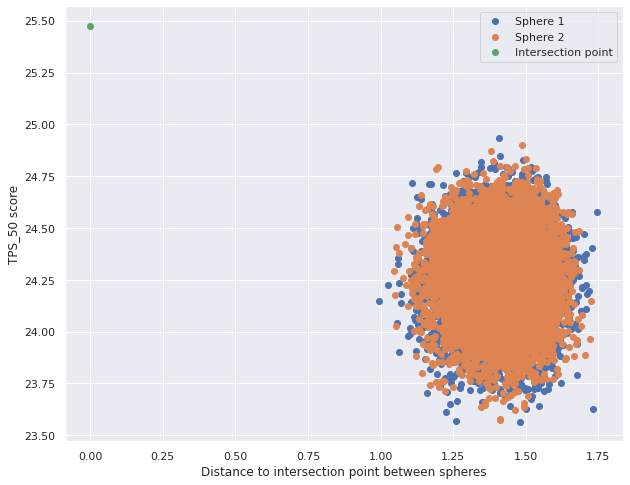

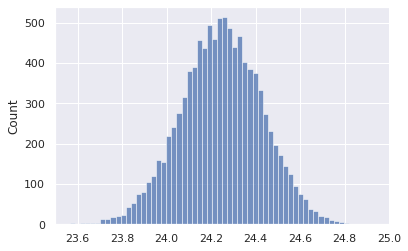

Sphere 1 mean: 24.244878019863116


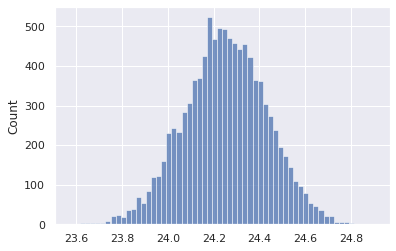

Sphere 2 mean: 24.24962762789396
Intersection TPS: 25.473537315542906
-- Sphere dimensionality: 300 --


  0%|          | 0/20001 [00:00<?, ?it/s]

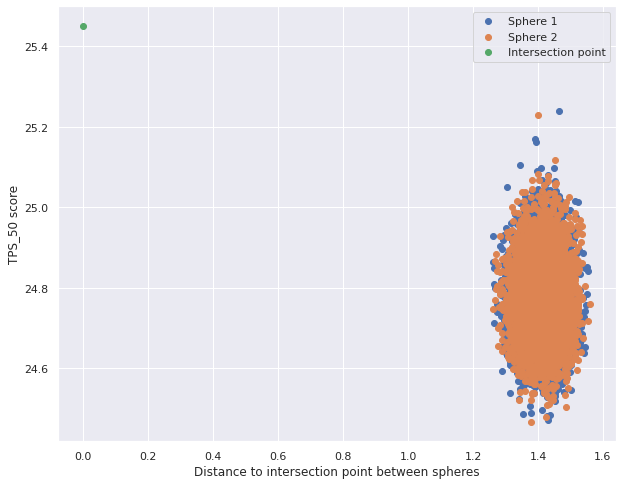

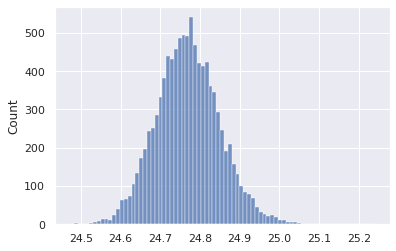

Sphere 1 mean: 24.76998330291711


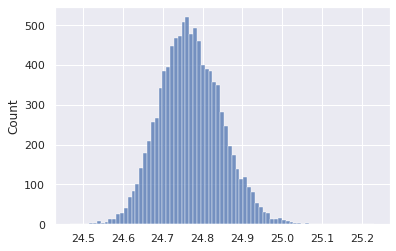

Sphere 2 mean: 24.770438415343218
Intersection TPS: 25.450051342898036


<IPython.core.display.Javascript object>

In [8]:
sphere_dimensionalities = [2, 3, 4, 5, 10, 20, 50, 300]
sphere_point_shift = 2
visualize_spheres = True
for sphere_dimensionality in sphere_dimensionalities:
    print(f"-- Sphere dimensionality: {sphere_dimensionality} --")
    point_in_each_sphere = 10000
    num_total_sphere_points = 2 * point_in_each_sphere + 1
    sphere_points, sphere_point_labels = generate_points_in_spheres(
        num_points=point_in_each_sphere,
        sphere_dimensionality=sphere_dimensionality,
        space_dimensionality=300,
        create_intersection_point=True,
        random_state=rng_seed,
    )
    sphere_points += sphere_point_shift
    sphere_points_normalized = normalize_array(sphere_points)

    # Visualize
    if visualize_spheres and sphere_dimensionality <= 3:
        fig = go.Figure()
        if sphere_dimensionality == 3:
            fig.add_trace(
                go.Scatter3d(
                    x=sphere_points[:, 0],
                    y=sphere_points[:, 1],
                    z=sphere_points[:, 2],
                    mode="markers",
                    marker={
                        "color": sphere_point_labels,
                    },
                )
            )
        else:
            fig.add_trace(
                go.Scatter(
                    x=sphere_points[:, 0],
                    y=sphere_points[:, 1],
                    mode="markers",
                    marker={
                        "color": sphere_point_labels,
                    },
                )
            )
        fig.show()

    # Find indices of points
    point_indices_in_sphere_1 = np.where(sphere_point_labels == 0)[0]
    point_indices_in_sphere_2 = np.where(sphere_point_labels == 1)[0]
    point_index_intersect = np.where(sphere_point_labels == 2)[0][0]

    # Compute TPS
    tps_scores_point_in_spheres = np.zeros(num_total_sphere_points)
    distances_to_intersection_point = np.zeros(num_total_sphere_points)
    for point_index in tqdm(range(num_total_sphere_points)):
        tps_score = tps_point_cloud(
            point_index=point_index,
            neighbourhood_size=tps_neighbourhood_size,
            point_cloud_normalized=sphere_points_normalized,
            return_persistence_diagram=False,
        )
        tps_scores_point_in_spheres[point_index] = tps_score

        # Compute distance to intersection point
        distance_to_intersection_point = np.linalg.norm(
            sphere_points[point_index] - sphere_points[point_index_intersect]
        )
        distances_to_intersection_point[point_index] = distance_to_intersection_point

    # Plot distance to intersection point vs. TPS score
    fig, ax = plt.subplots(figsize=(10, 8))
    for i in range(3):
        point_indices = np.where(sphere_point_labels == i)[0]
        ax.scatter(
            x=distances_to_intersection_point[point_indices],
            y=tps_scores_point_in_spheres[point_indices],
        )
    ax.set_xlabel("Distance to intersection point between spheres")
    ax.set_ylabel("TPS_50 score")
    plt.legend(["Sphere 1", "Sphere 2", "Intersection point"])
    plt.show()

    if visualize_spheres and sphere_dimensionality <= 3:
        fig = go.Figure()
        if sphere_dimensionality == 3:
            fig.add_trace(
                go.Scatter3d(
                    x=sphere_points[:, 0],
                    y=sphere_points[:, 1],
                    z=sphere_points[:, 2],
                    mode="markers",
                    marker={
                        "color": tps_scores_point_in_spheres,
                    },
                    hovertext=tps_scores_point_in_spheres,
                )
            )
        else:
            fig.add_trace(
                go.Scatter(
                    x=sphere_points[:, 0],
                    y=sphere_points[:, 1],
                    mode="markers",
                    marker={
                        "color": tps_scores_point_in_spheres,
                    },
                    hovertext=tps_scores_point_in_spheres,
                )
            )
        fig.show()

    sns.histplot(tps_scores_point_in_spheres[point_indices_in_sphere_1])
    plt.show()
    print(
        "Sphere 1 mean:",
        np.mean(tps_scores_point_in_spheres[point_indices_in_sphere_1]),
    )

    sns.histplot(tps_scores_point_in_spheres[point_indices_in_sphere_2])
    plt.show()
    print(
        "Sphere 2 mean:",
        np.mean(tps_scores_point_in_spheres[point_indices_in_sphere_2]),
    )

    print("Intersection TPS:", tps_scores_point_in_spheres[point_index_intersect])